**This Jupyter notebook is a small follow-up to the [OSM Bike Analysis](https://github.com/marcelharing/osm-bike-analysis). It provides a qualitative overview of the bicycle connections in an area that you specify, and calculates the 'bikeability' of the traffic infrastructure.**

The issue with the classification of bicycle-only infrastructure, as seen in the OSM Bike Analysis, is that it often doesn't reflect the real situation. This may be because people are not using it because it is not comfortable enough, or because it is not the fastest connection. It may also be because a broad and coarse classification does not reflect properties such as smoothness, usage density or steepness. A more qualitative, yet still data-driven approach can be used to assess these issues. Multifactor analysis of stress level classification on every possible traffic infrastructure is a good solution for this, which can be done in this notebook. It takes into account this attributes from OpenStreetMap features:

* Surface of ways
* Road classification (e.g. cycle tracks, residential streets)
* Maximum speed
* Smoothness

Using four attributes is a quite simple approach, but good for a first overview. For more profound information on bikability or stress level assesment see:
* Wysling, Laura/Purves, Ross S. (2022). Where to improve cycling infrastructure? Assessing bicycle suitability and bikeability with open data in the city of Paris. Transportation Research Interdisciplinary Perspectives 15, 100648.
https://doi.org/10.1016/j.trip.2022.100648.
* Schmid-Querg, Jonas/Keler, Andreas/Grigoropoulos, Georgios (2021). The Munich. Bikeability Index: A Practical Approach for Measuring Urban Bikeability. Sustainability 13 (1), 428. https://doi.org/10.3390/su13010428. Schmid-Querg et al.
* Hardinghaus, Michael/Weschke, Jan (2023). Transforming bicycle market: Assessing cyclists route preferences on different bike types in a choice experiment. Transportation Research Interdisciplinary Perspectives 22, 100921.
https://doi.org/10.1016/j.trip.2023.100921.
* Abad, Lorena/van der Meer, Lucas (2018). Quantifying Bicycle Network Connectivity in Lisbon Using Open Data. Information 9 (11), 287. https://doi.org/10.3390/info9110287.


# Data Preparation

## Import libraries

In [2]:
try:
    import google.colab
    import os

    # Clone the repository
    if not os.path.exists("/content/osm-bike-analysis"):
        !git clone https://github.com/marcelharing/osm-bike-analysis.git
        pass

    # Change the working directory
    %cd osm-bike-analysis

    # Install dependencies
    !pip --quiet install -r requirements.txt

    # Google Colab saves files in an folder named content
    diskpath = os.getcwd()
    
except ImportError:
    diskpath = '.' # relative file path

In [3]:
#### LIBRARIES ####
import osmnx
import ipywidgets as widgets

import os
import geopandas as gpd
import contextily as cx
import momepy
import networkx as nx
import matplotlib.pyplot as plt
from matplotlib_scalebar.scalebar import ScaleBar # for scalebar
from matplotlib.colors import LinearSegmentedColormap # for custom cmaps
import folium
from folium.plugins import ScrollZoomToggler
from folium.plugins import DualMap 
from folium.plugins import GroupedLayerControl
import xyzservices.providers as xyz
import branca.colormap as cm

import seaborn as sns
import pandas as pd
from functions import * 

In [4]:
#### STYLE CONFIGURATION ####
# Define Folium layers for leaflet maps

basemapat = xyz.BasemapAT.highdpi(name="BasemapAT", max_zoom=21)
esri = xyz.Esri.WorldImagery(max_zoom=21)
opentopomap = xyz.OpenTopoMap(max_zoom=21)

## Choose a city, town or region as study area

⏩ You can choose any **administrative boundary** (as relation) in OSM. Search for it like in [Nominatim](https://nominatim.openstreetmap.org/ui/search.html), for example: *Innsbruck, Austria*

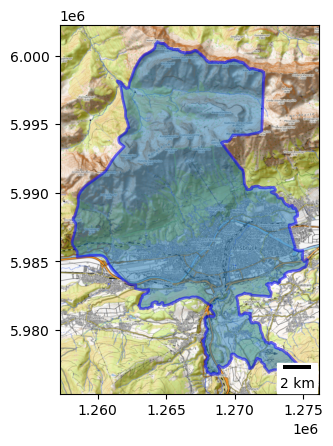

In [5]:
#### CHOOSE THE CITY, TOWN OR REGION YOU WANT TO ANALYZE ####
nominatim_area = input("Please enter the city, town or region you want to analyze: ")

gdf_area = osmnx.geocode_to_gdf(nominatim_area)

# Plot the area with a larger figure size
f, ax = plt.subplots()  # Adjust the figsize as needed
gdf_area.to_crs(epsg=3857).plot(ax=ax, alpha=0.5, edgecolor="b", linewidth=2)
cx.add_basemap(
    ax,
    source="https://tile.opentopomap.org/{z}/{x}/{y}.png",
)

# Add scale bar
scalebar = ScaleBar(1, location='lower right')  # 1 pixel = 1 meter
ax.add_artist(scalebar)

# Get the area as a GEOJSON file
gjson_area = gdf_area.to_json()

# areaID is always osm_id + 3600000000, has to be a relation, gdf_area.osm_id comes from osmnx nominatim query above
areaId = gdf_area.osm_id[0] + 3600000000

plt.show()

# Calculate the bounding box of the geometries
x_min, y_min, x_max, y_max = gdf_area.geometry.total_bounds

# Calculate the center of the bounding box for folium map starting position
folium_start_pos_x = (x_min + x_max) / 2
folium_start_pos_y = (y_min + y_max) / 2

## Overpass Queries

Overpass is a web API that allows users to get and **filter specific OSM features**. It has its own [query language](https://wiki.openstreetmap.org/wiki/Overpass_API/Overpass_QL).

All queries are already defined and nothing needs to be done anymore. But if you want to analyse **your own set of OSM attributes** (for example, all one-way streets where bicycles can also travel against the one-way traffic flow), you can define and analyse your own infrastructure class.  You can use the Overpass [Turbo Wizard](https://overpass-turbo.eu/) to do this. However, the query output should be in XML format `[out:xml] ` and return also metadata `out meta;` so it should look like this:
```[out:xml][timeout:200];
area(id:{areaId})->.searchArea;
(
  FEATURES SETS HERE
);
(._;>;);
out meta;
```
Note that if you select attributes that are already in the other queries, there may be duplicates when summed up to total bicycle infrastructure.


In [6]:
#### OVERPASS QUERY ####

### TRAFFIC INFRASTRUCTURE ###
query_traffic_infrastructure = f"""

[out:xml][timeout:200];
area(id:{areaId})->.searchArea;
(
  way["highway"="primary"]["bicycle"!="no"]["access"!="no"](area.searchArea);
  way["highway"="secondary"]["bicycle"!="no"]["access"!="no"](area.searchArea);
  way["highway"="tertiary"]["bicycle"!="no"]["access"!="no"](area.searchArea);
  way["highway"="unclassified"]["bicycle"!="no"]["access"!="no"](area.searchArea);
  way["highway"="residential"]["bicycle"!="no"]["access"!="no"](area.searchArea);
  way["highway"="primary_link"]["bicycle"!="no"]["access"!="no"](area.searchArea);
  way["highway"="secondary_link"]["bicycle"!="no"]["access"!="no"](area.searchArea);
  way["highway"="tertiary_link"]["bicycle"!="no"]["access"!="no"](area.searchArea);
  way["highway"="living_street"]["bicycle"!="no"]["access"!="no"](area.searchArea);
  way["highway"="service"]["bicycle"!="no"]["access"!="no"](area.searchArea);
  way["highway"="pedestrian"]["bicycle"!="no"]["access"!="no"](area.searchArea);
  way["highway"="track"]["bicycle"!="no"]["access"!="no"](area.searchArea);
);
(._;>;);
out meta;
"""
### CYCLE PATHS ###
query_cycle_paths= f"""
/*
“(cycleway=lane OR cycleway=opposite_lane) OR (cycleway:right=lane OR cycleway:right=opposite_lane) OR (cycleway:left=lane OR cycleway:left=opposite_lane) OR (cycleway:both=lane OR cycleway:both=opposite_lane) in Innsbruck”
*/
[out:xml][timeout:200];
area(id:{areaId})->.searchArea;
(
  way["highway"="cycleway"](area.searchArea);
  way["highway"="path"]["bicycle"="designated"](area.searchArea);
  way["highway"="path"]["bicycle"="yes"](area.searchArea);
  way["highway"="path"]["bicycle"="permissive"](area.searchArea);
  way["highway"="footway"]["bicycle"="designated"](area.searchArea);
  way["highway"="footway"]["bicycle"="yes"](area.searchArea);
  way["highway"="footway"]["bicycle"="permissive"](area.searchArea);
);
(._;>;);
out meta;
"""


⏩ You can define your own infrastructure class if you wish, otherwise just run this cell and leave everything as it is:

In [7]:
#### OWN QUERY ####
if os.path.exists(f"{diskpath}/osm_data/export_own_osm2geojson.osm"):
    print("Delete existing file with own infrastructure data")
    os.remove(f"{diskpath}/osm_data/export_own_osm2geojson.osm")

# Put your own query here
query_own = ""

The data is retrieved from OSM using the Overpass API and the appropriate queries. This data is used to create a graph, nodes and edges for each bicycle infrastructure.

The graph is used for topological evaluations, in this notebook these are the betweenness centrality and orientation of the bicycle infrastructure.
Edges and nodes of the bicycle infrastructure network are derived from the graph; the former is used to visualise the network in the maps and plots.
Finally, a GeoDataFrame is generated directly from the OSM data. This contains additional metadata. The version of the OSM features (Linus Law) is analysed with this dataset.

In [8]:
#### CALL TO OVERPASS API ####
"""
The dictionary for each 'infr_class' contains the following elements:

- 'query': The query statement to retrieve data.
- 'name': The name of the infrastructure class.
- 'color': A unique color for visual representation.
- 'graph': routable directed and simplified OSMNX graph. 
  This graph is routable and represents the infrastructure in both directions (i.e. if edges are bidirectional, they exist twice).
  Like the other graphs it is projected and clipped to the study area at the next edge outside the study area.
- 'gdf_xml': A separate GeoDataFrame directly from the XML file. This GeoDataFrame includes 'version' and 'timestamp' columns,
  which are part of the Overpass API's meta output. Note that osmnx does not provide this metadata. However, the XML-derived
  GeoDataFrame is not routable and contains the original number of OSM features. The nodes which were used for osmnx will be excluded.
  To prevent errors, if there are no features a empty GDF is created.
"""
dict_cycle_paths = {
    "query": query_cycle_paths,
    "name": "cycle_path_lanes",
    "color": "#0a007b",
    "graph": "",
}
dict_traffic_infrastructure = {
    "query": query_traffic_infrastructure,
    "name": "traffic_infrastructure",
    "color": "#600259",
    "graph": "",
}

dict_own = {"query": query_own, "name": "own", "color": "green", "graph": ""}
ls_classes = [dict_cycle_paths, dict_traffic_infrastructure, dict_own]

# Call Overpass API, built a OSMNX graph and a GeoDataFrame and update the dictionary with 'to_data_dict'
ls_classes = to_data_dict(
    ls_classes=ls_classes, area_name=nominatim_area, diskpath=diskpath, clip=False
)

No own infrastructur class choosen!


In [9]:
#### TOTAL INFRASTRUCTURE ####
"""
The dictionary for the total infrastructure (combined classes) contains the following elements:

- 'name': The name of the infrastructure class.
- 'color': A unique color for visual representation.
- 'graph': routable directed and simplified OSMNX graph. 
  This graph is routable and represents the infrastructure in both directions (i.e. if edges are bidirectional, they exist twice).
  Like the other graphs it is projected and clipped to the study area at the next edge outside the study area.
- 'gdf_xml': A separate GeoDataFrame directly from the XML file. This GeoDataFrame includes 'version' and 'timestamp' columns,
  which are part of the Overpass API's meta output. Note that osmnx does not provide this metadata. However, the XML-derived
  GeoDataFrame is not routable and contains the original number of OSM features.
"""

# Create a list of non-empty MultiDiGraphs created in the section above
graphs = [
    dict_cycle_paths["graph"],
    dict_traffic_infrastructure["graph"],
    dict_own["graph"],
]
graphs_valid = [x for x in graphs if x]  # only non-empty graphs allowed

if graphs_valid:
    # Combine the Graphs together into one if Gs_valid is not empty
    combined_Gs = nx.compose_all(graphs_valid)
    combined_Gs = osmnx.simplification.simplify_graph(combined_Gs)
else:
    raise ValueError("NO INFRASTRUCTURE IN YOUR STUDY AREA. STOPPING SCRIPT.")


# New column with infrastructure class to distinguish infr_classes in total GeoDataFrame
dict_cycle_paths["gdf_xml"]["infr_class"] = "Cycle Paths and Lanes"
dict_traffic_infrastructure["gdf_xml"]["infr_class"] = "Traffic Infrastructure"
dict_own["gdf_xml"]["infr_class"] = "Own Infrastructure"

# Combine all classes in one total GeoDataFrame
combined_GDFs = gpd.GeoDataFrame(
    pd.concat(
        [
            dict_cycle_paths["gdf_xml"],
            dict_traffic_infrastructure["gdf_xml"],
            dict_own["gdf_xml"],
        ],
        ignore_index=True,
    ),
    crs=[
        dict_cycle_paths["gdf_xml"],
        dict_traffic_infrastructure["gdf_xml"],
        dict_own["gdf_xml"],
    ][0].crs,
)

dict_total = {"color": "#323232", "graph": combined_Gs, "gdf_xml": combined_GDFs}


C:\Users\marce\AppData\Local\Temp\ipykernel_18168\4137325259.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  pd.concat(


In some rare cases there can be duplicates. This is the case when a feature is classified in more than one infrastructure class (for example because a street is a calm traffic way and has in addition cycle lanes).

In [10]:
# Drop duplicates in the GeoDataFrames
if dict_total["gdf_xml"].duplicated("geometry").any():
    print("Duplicates in GeodataFrame dropped.")
dict_total["gdf_xml"].drop_duplicates(subset="geometry", keep="first", inplace=True)

# First Overview of Study Area and Bicycle Infrastructure

Get a first overview of the bicycle infrastructure in your study area with some basic maps and charts.

## Overview Maps and Orientation of bicycle infrastructure

The following maps and charts provide a spatial **overview of the characteristics of each infrastructure** in your study area.

In addition, the **orientation** of the infrastructure is calculated. This shows in which directions the cycling infrastructure as a whole is oriented and gives a sense of where the main infrastructure is oriented. For further background information see
* Boeing, G. (2019). Urban Spatial Order: Road network orientation, configuration and entropy. Applied Network Science, 4 (1), 67. https://doi.org/10.1007/s41109-019-0189-1

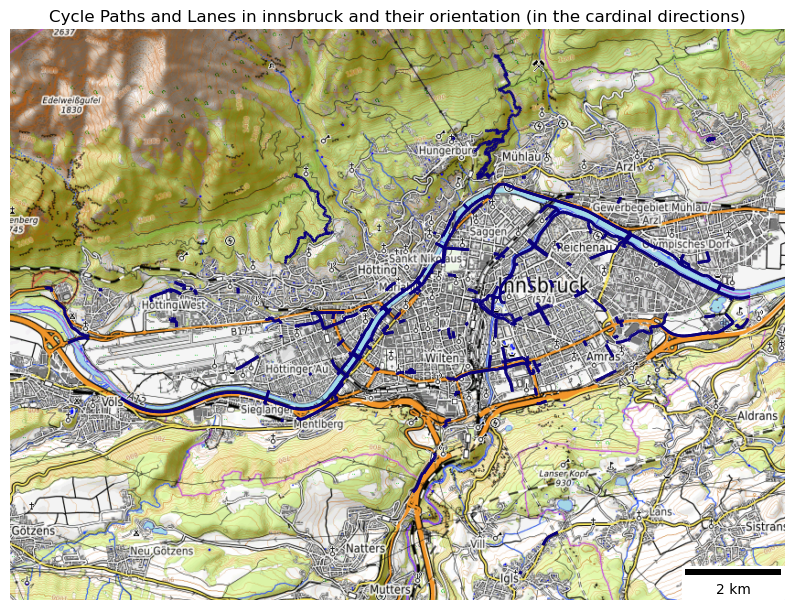

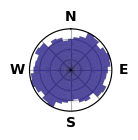

In [ ]:
plot_infr(dict_cycle_paths, "Cycle Paths", nominatim_area)

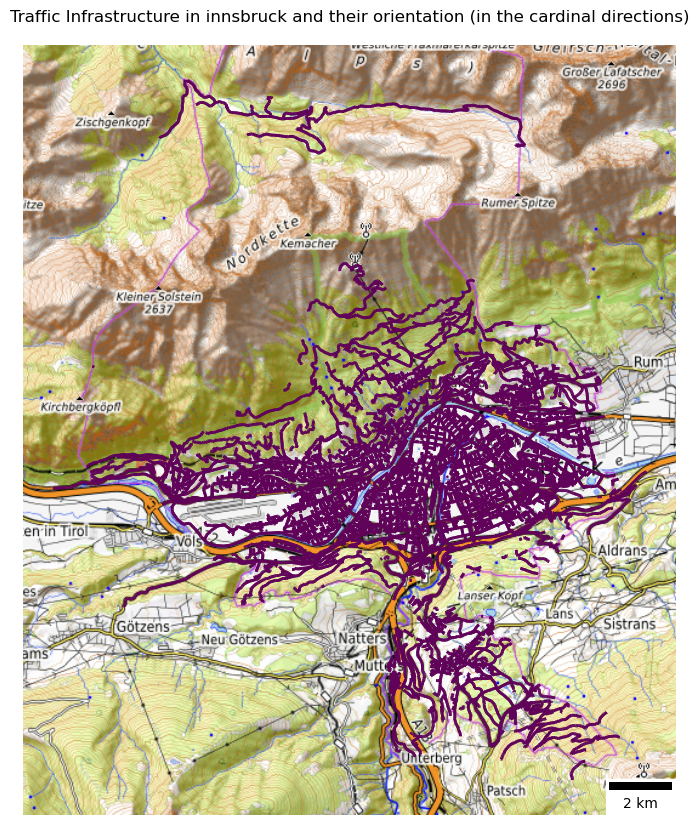

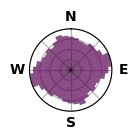

In [12]:
plot_infr(dict_traffic_infrastructure, "Traffic Infrastructure", nominatim_area)

In [13]:
if dict_own["query"]:
    plot_infr(dict_own, "Own Infrastructure Class", nominatim_area)

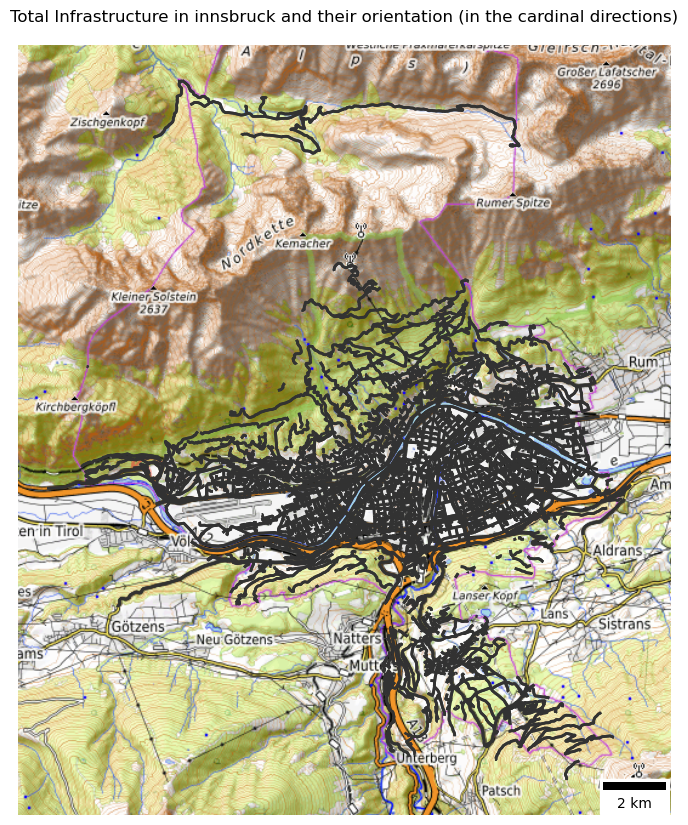

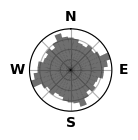

In [14]:
plot_infr(dict_total, "Total Infrastructure", nominatim_area)

# Assessing traffic stress

## Scoring scheme and default values 

Each possible tag is assigned a value that determines how comfortable it is to use. A value of 1 represents "not comfortable", while 10 represents "very comfortable". The values are choosen arbitrary based on a heuristic approach. You can also change them if you want prioritize diferrent aspects.

| category | tag | value (1–10) |
|---|---|---:|
| Smoothness | very_horrible | 1 |
| Smoothness | horrible | 2 |
| Smoothness | very_bad | 3 |
| Smoothness | bad | 4 |
| Smoothness | intermediate | 6 |
| Smoothness | good | 8 |
| Smoothness | excellent | 10 |
| Surface | unhewn_cobblestone | 1 |
| Surface | grass | 2 | 
| Surface | dirt | 2 |
| Surface | earth | 2 | 
| Surface | cobblestone | 2 |
| Surface | unpaved | 3 |
| Surface | ground | 3 |
| Surface | gravel | 4 |
| Surface | sett | 4 | 
| Surface | paving_stones | 4 |
| Surface | compacted | 5 |
| Surface | grass_paver | 6 |
| Surface | fine_gravel | 6 |
| Surface | paved | 8 |
| Surface | concrete | 10 |
| Surface | asphalt | 10 |
| Maxspeed | >50 | 1 |
| Maxspeed | 50 | 2 |
| Maxspeed | 40 | 4 |
| Maxspeed | 30 | 6 |
| Maxspeed | 20 | 8 |
| Maxspeed | 10 | 10 |
| Highway class | primary/primary_link | 1 |
| Highway class | secondary/secondary_link | 2 |
| Highway class | tertiary/tertiary_link | 3 |
| Highway class | unclassified | 5 |
| Highway class | track | 7 |
| Highway class | residential | 7 |
| Highway class | pedestrian | 8 |
| Highway class | living_street | 9 |
| Highway class | path | 9 |
| Highway class | footway | 10 |
| Highway class | cycleway | 10 |


In [15]:
osm_tag_scores = {
    "smoothness": {
        "very_horrible": 1,
        "horrible": 2,
        "very_bad": 3,
        "bad": 4,
        "intermediate": 6,
        "good": 8,
        "excellent": 10,
    },
    "surface": {
        "unhewn_cobblestone": 1,
        "grass": 2,
        "dirt": 2,
        "earth": 2,
        "cobblestone": 2,
        "unpaved": 3,
        "ground": 3,
        "gravel": 4,
        "sett": 4,
        "paving_stones": 4,
        "compacted": 5,
        "grass_paver": 6,
        "fine_gravel": 6,
        "paved": 7,
        "concrete": 9,
        "asphalt": 9,
    },
    "maxspeed": {
        ">50": 0,
        "50": 1,
        "40": 3,
        "30": 6,
        "20": 8,
        "10": 10,
    },
    "highway class": {
        "primary": 1,
        "primary_link": 1,
        "secondary": 1,
        "secondary_link": 1,
        "tertiary": 2,
        "tertiary_link": 2,
        "unclassified": 4,
        "track": 7,
        "residential": 7,
        "pedestrian": 8,
        "living_street": 9,
        "path": 9,
        "footway": 10,
        "cycleway": 10,
    },
}


If no values are available from OpenStreetMap for maximum speed, surface or smoothness, the default values are used and the missing data is recorded. This is only a temporary fix, and missing tags could misrepresent the current situation on the ground. For a more advanced approach to deal with default values, see, for example: https://github.com/SupaplexOSM/OSM-Cycling-Quality-Index.

In [16]:
default_values_by_highway_class = {
    "primary": {"maxspeed": 50, "surface": "asphalt", "smoothness": "very_bad"},
    "primary_link": {"maxspeed": 50, "surface": "asphalt", "smoothness": "very_bad"},
    "secondary": {"maxspeed": 50, "surface": "asphalt", "smoothness": "bad"},
    "secondary_link": {"maxspeed": 50, "surface": "asphalt", "smoothness": "bad"},
    "tertiary": {"maxspeed": 50, "surface": "asphalt", "smoothness": "intermediate"},
    "tertiary_link": {"maxspeed": 50, "surface": "asphalt", "smoothness": "intermediate"},
    "unclassified": {"maxspeed": 40, "surface": "asphalt", "smoothness": "good"},
    "residential": {"maxspeed": 30, "surface": "asphalt", "smoothness": "good"},
    "living_street": {"maxspeed": 20, "surface": "asphalt", "smoothness": "excellent"},
    "track": {"maxspeed": 20, "surface": "gravel", "smoothness": "bad"},
    "pedestrian": {"maxspeed": 10, "surface": "paved", "smoothness": "excellent"},
    "path": {"maxspeed": 10, "surface": "ground", "smoothness": "bad"},
    "footway": {"maxspeed": 10, "surface": "asphalt", "smoothness": "good"},
    "cycleway": {"maxspeed": 10, "surface": "asphalt", "smoothness": "good"},
}

default_values_track = {
    "grade1": {"maxspeed": 20, "surface": "asphalt", "smoothness": "good"},
    "grade2": {"maxspeed": 20, "surface": "compacted", "smoothness": "intermediate"},
    "grade3": {"maxspeed": 20, "surface": "compacted", "smoothness": "intermediate"},
    "grade4": {"maxspeed": 20, "surface": "dirt", "smoothness": "bad"},
    "grade5": {"maxspeed": 20, "surface": "grass", "smoothness": "horrible"},
}

## Evaluation of OSM Features

Now highway_class, maxspeed, surface and smoothness is added as column.

In [17]:
# Add columns for the selected OSM tags and fill missing values based on the default values defined above
dict_total["gdf_xml"] = add_osm_tag_columns(dict_total["gdf_xml"])

And the stress score is calculated. There can be maximally 10 points for each tag, so the maximum score is 40.

In [18]:
# Calculate the score and missing tags for each row in the GeoDataFrame
dict_total["gdf_xml"][["score", "missing_tags"]] = dict_total["gdf_xml"].apply(
    lambda row: calculate_score_and_missing_tags(row, osm_tag_scores, default_values_by_highway_class, default_values_track), 
    axis=1
)

# Results

Underneath is a result of the stress level map. For the stress level classification, we use four classes. The classes have the same intervalls of 10 points. Class 4 (red) stands for low comfort when using this traffic infrastructure, class 1 (blue) for high comfort.

In [19]:
# Score classification colors
score_class_colors = {
    1: "#2166ac",
    2: "#67a9cf",
    3: "#ef8a62",
    4: "#b2182b",
}

# Assign score classes based on the calculated score
dict_total["gdf_xml"]["score_class"] = dict_total["gdf_xml"]["score"].apply(classify_score)

score_class_legend = cm.StepColormap(
    colors=[score_class_colors[4], score_class_colors[3], score_class_colors[2], score_class_colors[1]],
    index=[0, 11, 21, 31, 41],
    vmin=0,
    vmax=40,
    caption="Score class (4 = low, 1 = high)",
)

In [20]:
# Folium map overview of infrastructure classes
overview_map_osm = folium.Map(
    location=[folium_start_pos_y, folium_start_pos_x],
    tiles=basemapat,
    name="BasemapAT",
    zoom_start=11,
    control_scale=True,
)

# Add imagery base layer
folium.raster_layers.TileLayer(opentopomap, show=False, name="OpenTopoMap").add_to(
    overview_map_osm
)
folium.raster_layers.TileLayer(esri, show=False, name="Esri World Imagery").add_to(
    overview_map_osm
)

# Load gdf as geojson and color by score class
folium.GeoJson(
    dict_total["gdf_xml"],
    style_function=lambda feature: {
        "color": score_class_colors.get(feature["properties"].get("score_class"), "#999999"),
        "weight": 6,
        "opacity": 1,
    },
    tooltip=folium.GeoJsonTooltip(
        fields=["score", "score_class", "highway class", "surface", "smoothness", "maxspeed"],
        aliases=["Stress Level Score", "Stress Level Class", "Highway class", "Surface", "Smoothness", "Maxspeed"],
        localize=True,
        labels=True,
    ),
    name="Score class map",
).add_to(overview_map_osm)

# Add zoom toggler to forbid mouse wheel zooming
folium.plugins.ScrollZoomToggler().add_to(overview_map_osm)
# Add color scale legend
score_class_legend.add_to(overview_map_osm)
# Add layer control
folium.LayerControl().add_to(overview_map_osm)

os.makedirs("./maps", exist_ok=True)
overview_map_osm.save("./maps/overview_map_osm.html")
overview_map_osm